# Carte animée des feux de forêts aux USA
## Carte animée sur l'année 2015

In [1]:
import numpy as np
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_theme()

from mpl_toolkits.basemap import Basemap
from matplotlib import animation

In [2]:
# Import fichier et création du dataframe de base
conn = sqlite3.connect("data\data_wildfire_usa.sqlite")
fires = pd.read_sql_query("SELECT * FROM fires", conn)
fires_usa = fires.loc[(fires.loc[:,'STATE']!='AK') & (fires.loc[:,'STATE']!='HI') & (fires.loc[:,'STATE']!='PR')]
fires_usa = fires_usa.rename(columns = {'DISCOVERY_DOY' : 'DISCOVERY_DAY', 'CONT_DOY' : 'CONT_DAY'})


In [15]:
# Création et cleaning du dataframe pour la carte animée
animated_map = pd.DataFrame(fires_usa[['FIRE_YEAR','LATITUDE','LONGITUDE','FIRE_SIZE_CLASS','FIRE_SIZE','STATE','DISCOVERY_DAY','CONT_DAY']])
animated_map = animated_map[animated_map['FIRE_YEAR']==2015]
animated_map.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73688 entries, 1789011 to 1880464
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FIRE_YEAR        73688 non-null  int64  
 1   LATITUDE         73688 non-null  float64
 2   LONGITUDE        73688 non-null  float64
 3   FIRE_SIZE_CLASS  73688 non-null  object 
 4   FIRE_SIZE        73688 non-null  float64
 5   STATE            73688 non-null  object 
 6   DISCOVERY_DAY    73688 non-null  int64  
 7   CONT_DAY         61423 non-null  float64
dtypes: float64(4), int64(2), object(2)
memory usage: 5.1+ MB


In [16]:
# Vérification des NaN
print(animated_map.isna().sum())
animated_map = animated_map.dropna()
animated_map

FIRE_YEAR              0
LATITUDE               0
LONGITUDE              0
FIRE_SIZE_CLASS        0
FIRE_SIZE              0
STATE                  0
DISCOVERY_DAY          0
CONT_DAY           12265
dtype: int64


,FIRE_YEAR,LATITUDE,LONGITUDE,FIRE_SIZE_CLASS,FIRE_SIZE,STATE,DISCOVERY_DAY,CONT_DAY
1789011,2015,45.934167,-113.020833,A,0.10,MT,226,227.0
1789013,2015,45.727222,-112.943889,A,0.25,MT,195,196.0
1789015,2015,44.416667,-112.843333,A,0.10,MT,272,299.0
1789016,2015,46.052222,-113.635556,A,0.25,MT,181,183.0
1789017,2015,46.234444,-113.301667,A,0.10,MT,146,146.0
...,...,...,...,...,...,...,...,...
1880456,2015,40.019907,-122.391398,B,2.22,CA,165,165.0
1880457,2015,40.588583,-123.069617,B,1.00,CA,273,274.0
1880458,2015,40.244833,-123.544167,B,4.00,CA,213,218.0
1880459,2015,38.415608,-122.660044,B,0.50,CA,148,148.0


In [17]:
# Vérification de la suppression des NaN => OK
print(animated_map.isna().sum())

FIRE_YEAR          0
LATITUDE           0
LONGITUDE          0
FIRE_SIZE_CLASS    0
FIRE_SIZE          0
STATE              0
DISCOVERY_DAY      0
CONT_DAY           0
dtype: int64


In [18]:
def active_fires(day):
    """
    Cette fonction renvoie l’emplacement et la taille des feux de forêt actifs au jour X de l’année
    
    """
    return animated_map[(animated_map['DISCOVERY_DAY'] <= day) & (animated_map['CONT_DAY'] >= day)]

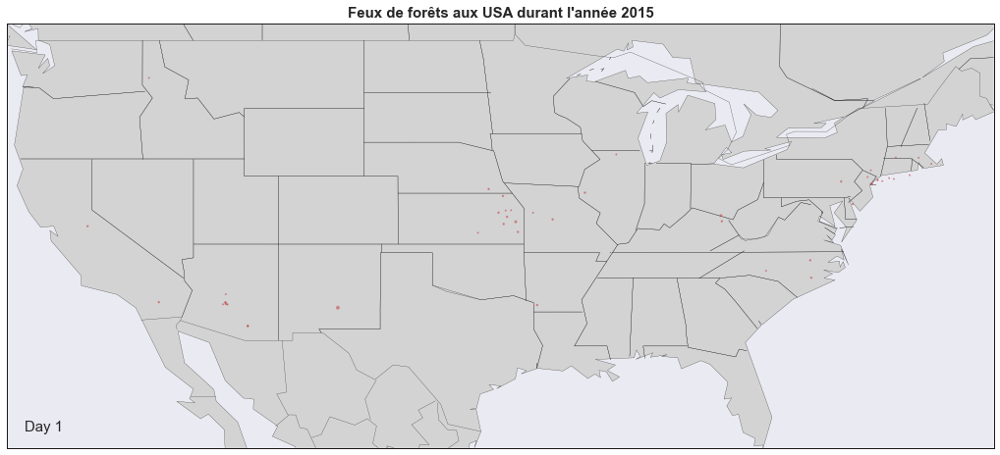

In [87]:
# Construction de l'animation : ce code affichera une image statique. 
# L’animation doit d’abord être enregistrée et pourra s'afficher ensuite. Elle montrera pour chaque jour tous les feux de forêt qui étaient actifs au cours de cette journée.
# A savoir que plus la taille de feu est grande, plus le cercle sur la carte est grand.

fig = plt.figure(figsize=(18, 16))
    
map = Basemap(projection='cyl',llcrnrlat=25,urcrnrlat=50,\
            llcrnrlon=-125,urcrnrlon=-67)

map.drawcoastlines(linewidth=0.25)
map.drawcountries(linewidth=0.25)
map.drawstates(linewidth=0.25)
map.drawmapboundary()
map.fillcontinents(color='lightgray', zorder=1)

scat = map.scatter([], [])

day_label = plt.text(-124,26,'Day 1',fontsize=15)

def anim(frame_number):
    day = frame_number+1
    fires_this_day = active_fires(day)
    xs, ys = map(fires_this_day['LONGITUDE'], fires_this_day['LATITUDE'])
    data = np.dstack((xs, ys))[0]
    scat.set_color('r')
    scat.set_alpha(0.5)
    scat.set_zorder(10)
    scat.set_sizes(fires_this_day['FIRE_SIZE_CLASS'].map({'A':1,'B':2,'C':4,'D':8,'E':16,'F':32,'G':64}))
    scat.set_offsets(data)
    day_label.set_text("Day {}".format(day))
    return scat,

ani = animation.FuncAnimation(fig, anim, interval=100, frames=365, repeat=False, blit=True)

plt.title("Feux de forêts aux USA durant l'année 2015", weight='bold', fontsize=15)

plt.show()

In [88]:
# Sauvegarde de l'animation
ani.save('animation_map.gif', writer='imagemagick', fps=3)

MovieWriter imagemagick unavailable; using Pillow instead.



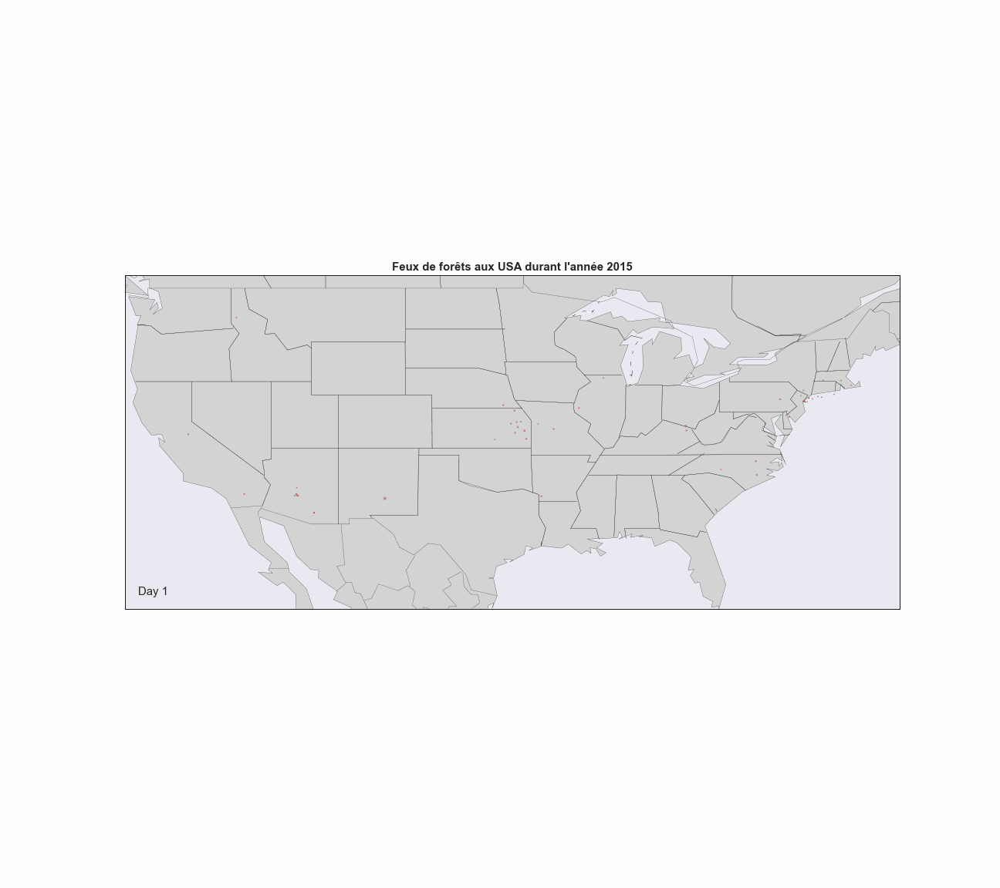

In [89]:
# Affichage de l'animation finale

from IPython.display import HTML
import io
import base64

filename = 'animation_map.gif'

video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" style="border-top:=100px; border-bottom:-100px;"/>'''.format(encoded.decode('ascii')))

Il pourrait être intéressant de voir le nombre de feux le jour de la fête de l'indépendance des Etats-Unis, de 1992 à 2015.

## Carte animée le 4 juillet de chaque année (fête nationale aux USA)

In [72]:
# Création et cleaning du dataframe pour la carte animée
animated_map_j = pd.DataFrame(fires_usa[['FIRE_YEAR','LATITUDE','LONGITUDE','FIRE_SIZE_CLASS','FIRE_SIZE','STATE','DISCOVERY_DAY','CONT_DAY','DISCOVERY_DATE']])
animated_map_j.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1835646 entries, 0 to 1880464
Data columns (total 9 columns):
 #   Column           Dtype  
---  ------           -----  
 0   FIRE_YEAR        int64  
 1   LATITUDE         float64
 2   LONGITUDE        float64
 3   FIRE_SIZE_CLASS  object 
 4   FIRE_SIZE        float64
 5   STATE            object 
 6   DISCOVERY_DAY    int64  
 7   CONT_DAY         float64
 8   DISCOVERY_DATE   float64
dtypes: float64(5), int64(2), object(2)
memory usage: 204.5+ MB


In [73]:
# La colonne DISCOVERY_DATE n'est pas au bon format
# Changement du format de date de DISCOVERY_DATE
animated_map_j['DATE'] = pd.to_datetime(animated_map_j['DISCOVERY_DATE'] - pd.Timestamp(0).to_julian_date(), unit='D')
# Vérification succinte du format
print('Vérification format DATE avec la colonne FIRE_YEAR : \n', pd.DataFrame(animated_map_j['DATE']).join(animated_map_j['FIRE_YEAR']))

Vérification format DATE avec la colonne FIRE_YEAR : 
               DATE  FIRE_YEAR
0       2005-02-02       2005
1       2004-05-12       2004
2       2004-05-31       2004
3       2004-06-28       2004
4       2004-06-28       2004
...            ...        ...
1880460 2015-09-26       2015
1880461 2015-10-05       2015
1880462 2015-05-02       2015
1880463 2015-10-14       2015
1880464 2015-03-14       2015

[1835646 rows x 2 columns]


In [74]:
# Etude sur les feux ayant été découverts le 04/07 de chaque année. Pour cela, prenons la variable 'DATE' qui correspond à la date de découverte des feux.
# Création de colonnes avec uniquement les mois et les jours
animated_map_j['SPLIT_MONTH'] = animated_map_j['DATE'].dt.month
animated_map_j['SPLIT_DAY'] = animated_map_j['DATE'].dt.day

# Création d'un DataFrame avec uniquement les données datant du 4 juillet de chaque année
animated_map_july = animated_map_j[(animated_map_j['SPLIT_MONTH'] == 7) & (animated_map_j['SPLIT_DAY'] == 4)]

In [75]:
# Vérification des NaN
print(animated_map_july.isna().sum())
animated_map_july = animated_map_july.dropna()
animated_map_july

FIRE_YEAR             0
LATITUDE              0
LONGITUDE             0
FIRE_SIZE_CLASS       0
FIRE_SIZE             0
STATE                 0
DISCOVERY_DAY         0
CONT_DAY           5543
DISCOVERY_DATE        0
DATE                  0
SPLIT_MONTH           0
SPLIT_DAY             0
dtype: int64


,FIRE_YEAR,LATITUDE,LONGITUDE,FIRE_SIZE_CLASS,FIRE_SIZE,STATE,DISCOVERY_DAY,CONT_DAY,DISCOVERY_DATE,DATE,SPLIT_MONTH,SPLIT_DAY
66,2005,48.407778,-115.558333,A,0.10,MT,185,185.0,2453555.5,2005-07-04,7,4
172,2005,42.839722,-112.176667,A,0.10,ID,185,185.0,2453555.5,2005-07-04,7,4
173,2005,42.691389,-112.368611,A,0.10,ID,185,185.0,2453555.5,2005-07-04,7,4
304,2005,33.344444,-97.652222,C,40.00,TX,185,188.0,2453555.5,2005-07-04,7,4
305,2005,33.323611,-97.645833,C,15.00,TX,185,186.0,2453555.5,2005-07-04,7,4
...,...,...,...,...,...,...,...,...,...,...,...,...
1879547,2009,34.441257,-117.439200,B,1.00,CA,185,185.0,2455016.5,2009-07-04,7,4
1880045,2009,38.195464,-120.570714,A,0.25,CA,185,185.0,2455016.5,2009-07-04,7,4
1880114,2009,40.370471,-120.600330,B,2.00,CA,185,185.0,2455016.5,2009-07-04,7,4
1880177,2010,40.578904,-122.274388,A,0.25,CA,185,185.0,2455381.5,2010-07-04,7,4


In [76]:
# Vérification de la suppression des NaN => OK
print(animated_map_july.isna().sum())

FIRE_YEAR          0
LATITUDE           0
LONGITUDE          0
FIRE_SIZE_CLASS    0
FIRE_SIZE          0
STATE              0
DISCOVERY_DAY      0
CONT_DAY           0
DISCOVERY_DATE     0
DATE               0
SPLIT_MONTH        0
SPLIT_DAY          0
dtype: int64


In [77]:
def active_fires_july(year):
    """
    Cette fonction renvoie l’emplacement et la taille des feux de forêt actifs au 4 juillet de 1992 à 2015 aux USA
    
    """
    return animated_map_july[animated_map_july['FIRE_YEAR'] == year]

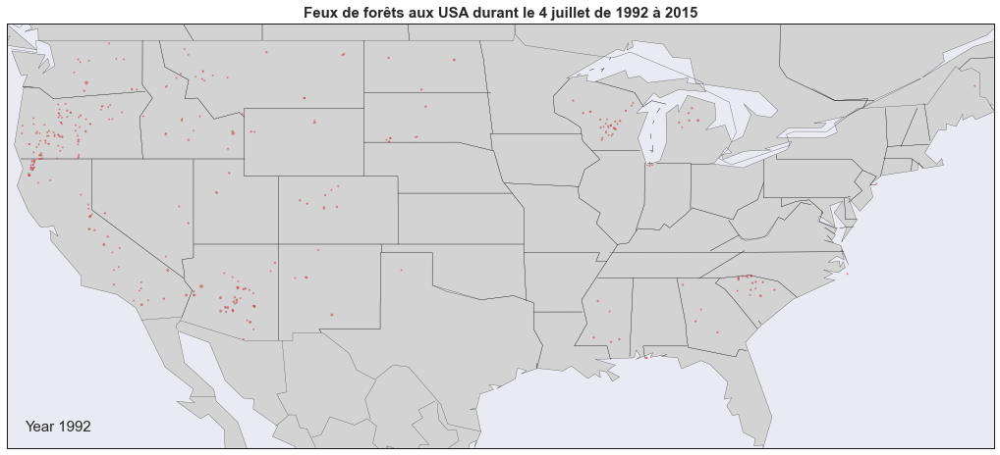

In [90]:
# L’animation doit d’abord être enregistrée et pourra s'afficher ensuite. Elle montrera pour chaque 4 juillet tous les feux de forêt qui étaient actifs au cours des années.
# A savoir que plus la taille de feu est grande, plus le cercle sur la carte est grand.

fig = plt.figure(figsize=(18, 16))
    
mapj = Basemap(projection='cyl',llcrnrlat=25,urcrnrlat=50,\
            llcrnrlon=-125,urcrnrlon=-67)

mapj.drawcoastlines(linewidth=0.25)
mapj.drawcountries(linewidth=0.25)
mapj.drawstates(linewidth=0.25)
mapj.drawmapboundary()
mapj.fillcontinents(color='lightgray', zorder=1)

scat = mapj.scatter([], [])

year_label = plt.text(-124,26,'Year 1992',fontsize=15)

def anim(frame_number):
    year = frame_number+1992
    fires_this_year = active_fires_july(year)
    xs, ys = mapj(fires_this_year['LONGITUDE'], fires_this_year['LATITUDE'])
    data = np.dstack((xs, ys))[0]
    scat.set_color('r')
    scat.set_alpha(0.5)
    scat.set_zorder(10)
    scat.set_sizes(fires_this_year['FIRE_SIZE_CLASS'].map({'A':1,'B':2,'C':4,'D':8,'E':16,'F':32,'G':64}))
    scat.set_offsets(data)
    year_label.set_text("Year {}".format(year))
    return scat,

ani_july = animation.FuncAnimation(fig, anim, interval=100, frames=24, repeat=False, blit=True)

plt.title("Feux de forêts aux USA durant le 4 juillet de 1992 à 2015", weight='bold', fontsize=15)

plt.show()

In [91]:
# Sauvegarde de l'animation
# (Pour mémoire : prend 2min.)
ani_july.save('animation_map_july.gif', writer='imagemagick', fps=3)

MovieWriter imagemagick unavailable; using Pillow instead.



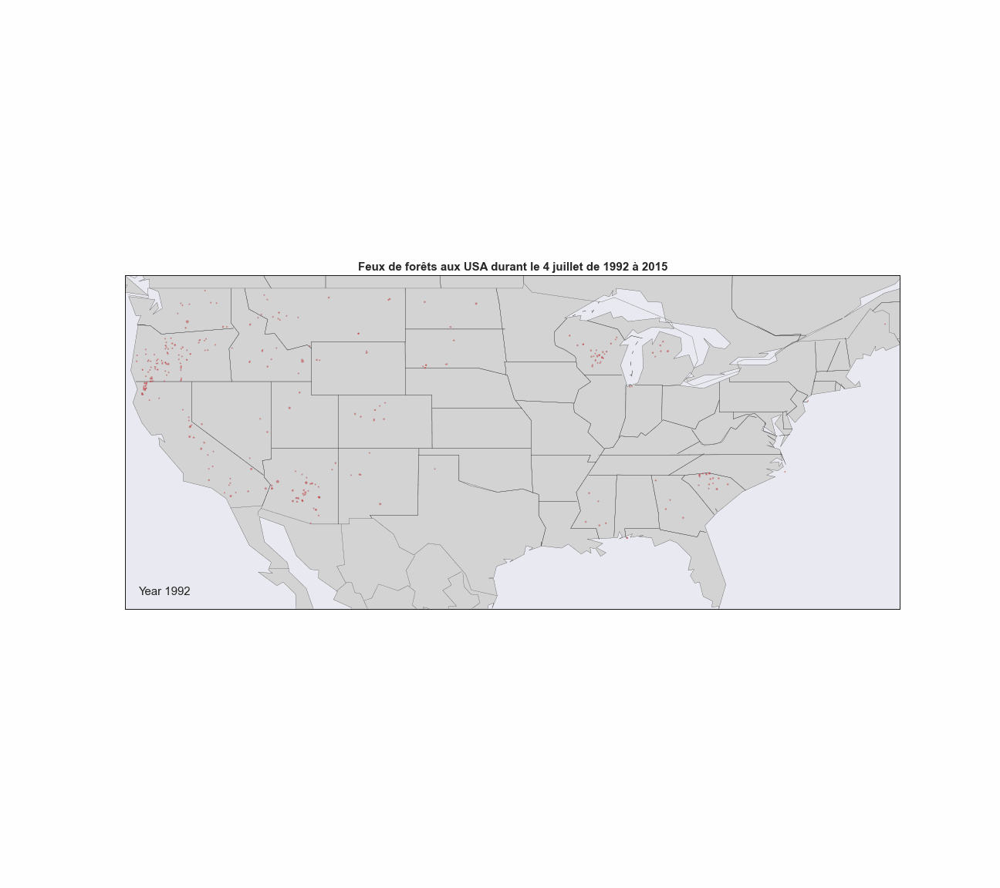

In [92]:
# Affichage de l'animation finale

from IPython.display import HTML
import io
import base64

filename = 'animation_map_july.gif'

video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" style="border-top:=100px; border-bottom:-100px;"/>'''.format(encoded.decode('ascii')))